# Barycenter Experiment


## imports and misc

In [35]:
from pathlib import Path
if "experiments" in Path.cwd().parts:
    %cd ..

import logging
import os
import sys
import warnings
import itertools as it
from time import perf_counter
def append_path(s):
    if s in sys.path:
        return
    sys.path.insert(0, s)
    
#You don’t need those lines if you installed the packages
#append_path("/home/tristan/research/ot_markov_distances/")
#append_path("/home/tristan/research/tb_ml/")
#append_path("/home/tristan/research/FGW/lib")
#sys.path.pop(sys.path.index("/home/tristan/research/ot_markov_distances/experiments"))

logging.basicConfig(level=logging.INFO, force=True)

In [36]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.tensorboard import SummaryWriter
from tqdm.notebook import trange, tqdm
import scipy
import scipy.sparse


In [37]:
from skimage.filters import threshold_otsu, threshold_yen

In [38]:
from ot_markov_distances import discounted_wl_infty as wl_reg_infty
from ot_markov_distances.utils import weighted_transition_matrix, draw_markov
from experiments.utils.modules import ParametricMarkovMatrixWithMatchings, ParametricMarkovMatrix, ParametricMarkovMatrixWithLabels
from experiments.utils.data_generation import circle_graph, FGW_build_noisy_circular_graph, add_er_noise, get_label_matrix

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [39]:
append_path("/home/tristan/research/FGW/lib")
from FGW import fgw_barycenters
from graph import Graph as FGW_Graph, graph_colors,draw_rel,draw_transp,find_thresh,sp_to_adjency


In [40]:
logging.basicConfig(level=logging.WARNING, force=True)

In [41]:
def grid_init(*args):
    match args:
        case []:
            return None
        case [n0, *tail]:
            return [grid_init(*tail) for _ in range(n0)]

def my_threshold(M):
    median = np.median(M)
    #print(median)
    return 3 * median # why hard when it could be easy

def markov_threshold(M, method=my_threshold):
    threshold = method(M)
    G = nx.from_numpy_array( M> threshold, create_using=nx.DiGraph)
    return G

## Optimization loop

Just put the optimization loop in a function to be able to reuse it

In [42]:
def opt_loop_batched(target_matrices, 
             n_steps=300, projection_size=5, 
             run_name="barycenter", 
            device = torch.device("cuda:3"), 
             lr=1e-2, 
             weight_decay=0,
             heat=1.,
             matching_heat=1.,
             wl_parameters = dict(delta=.5, sinkhorn_reg=.01, x_is_sparse=False, y_is_sparse=True),
             labels = None
            ):
    
    n_targets = len(target_matrices)
    target_sizes = [matrix.shape[0] for matrix in target_matrices]
    target_matrices = [matrix.to(device) for matrix in target_matrices]
    target_matrices_batched = torch.stack(target_matrices, dim=0)
    
    if labels is None:
        projection = ParametricMarkovMatrixWithMatchings(projection_size, 
                                                         *target_sizes, 
                                                         heat=heat,
                                                        matching_heat=matching_heat).to(device)
    else:
        projection = ParametricMarkovMatrixWithLabels(projection_size, *labels, heat=heat).to(device)
                                        

    target_measures = [
        torch.ones(size, device=device, requires_grad=False) / size
        for size in target_sizes]
    target_measures_batched = torch.stack(target_measures, dim=0)
    
    projection_measure = torch.ones((n_targets, projection_size), device=device, requires_grad=False) / projection_size


    optim = torch.optim.Adam(projection.parameters(), lr=lr, weight_decay=weight_decay)

    writer = SummaryWriter(f"{os.environ['HOME']}/tensorboard/{run_name}")
    parameter_values = []
    losses = []

    for step in trange(n_steps):
        optim.zero_grad()

        M, *Ds = projection()
        batched_Ds = torch.stack(Ds, dim=0)
        batched_M = M.expand(n_targets, -1, -1)
        
        loss = wl_reg_infty(batched_M, 
                            target_matrices_batched, 
                            batched_Ds, 
                            muX=projection_measure,
                            muY=target_measures_batched,
                            **wl_parameters).square().mean(0)
        loss.backward()
        optim.step()


        writer.add_scalar("loss", loss, step) 
        losses.append(loss.item())
        with torch.no_grad():
            markov, *matchings = projection.get()
            parameter_values.append(
                (markov.numpy(force=True), 
                 *(matching.detach().cpu() for matching in matchings)
                )
            )
            
    return projection, parameter_values, losses


In [43]:
def opt_loop_batched_reduce_sinkhorn_reg(target_matrices, 
             n_steps=300, projection_size=5, 
             run_name="barycenter", 
            device = torch.device("cuda:3"), 
             lr=1e-2, 
             weight_decay=0,
             heat=1.,
             matching_heat=1.,
             wl_parameters = dict(delta=.5, x_is_sparse=False, y_is_sparse=True),
             labels = None,
            sinkhorn_reg1 = 1,
            sinkhorn_reg2 = 1e-2
            ):
    
    n_targets = len(target_matrices)
    target_sizes = [matrix.shape[0] for matrix in target_matrices]
    target_matrices = [matrix.to(device) for matrix in target_matrices]
    target_matrices_batched = torch.stack(target_matrices, dim=0)
    
    if labels is None:
        projection = ParametricMarkovMatrixWithMatchings(projection_size, 
                                                         *target_sizes, 
                                                         heat=heat,
                                                        matching_heat=matching_heat).to(device)
    else:
        projection = ParametricMarkovMatrixWithLabels(projection_size, *labels, heat=heat).to(device)
                                        

    target_measures = [
        torch.ones(size, device=device, requires_grad=False) / size
        for size in target_sizes]
    target_measures_batched = torch.stack(target_measures, dim=0)
    
    projection_measure = torch.ones((n_targets, projection_size), device=device, requires_grad=False) / projection_size


    #optim = torch.optim.Adam(projection.parameters(), lr=lr, weight_decay=weight_decay)
    optim = torch.optim.SGD(projection.parameters(), lr=lr, weight_decay=weight_decay, momentum=1e-3)

    writer = SummaryWriter(f"{os.environ['HOME']}/tensorboard/{run_name}")
    parameter_values = []
    losses = []

    for step in trange(n_steps):
        optim.zero_grad()

        M, *Ds = projection()
        batched_Ds = torch.stack(Ds, dim=0)
        batched_M = M.expand(n_targets, -1, -1)
        
        loss = wl_reg_infty(batched_M, 
                            target_matrices_batched, 
                            batched_Ds, 
                            muX=projection_measure,
                            muY=target_measures_batched,
                            sinkhorn_reg = sinkhorn_reg1 * ((sinkhorn_reg2 / sinkhorn_reg1)**(step / n_steps)),
                            **wl_parameters).square().mean(0)
        loss.backward()
        optim.step()


        writer.add_scalar("loss", loss, step) 
        losses.append(loss.item())
        with torch.no_grad():
            markov, *matchings = projection.get()
            parameter_values.append(
                (markov.numpy(force=True), 
                 *(matching.detach().cpu() for matching in matchings)
                )
            )
            
    return projection, parameter_values, losses


## Non-oriented circles

### Data

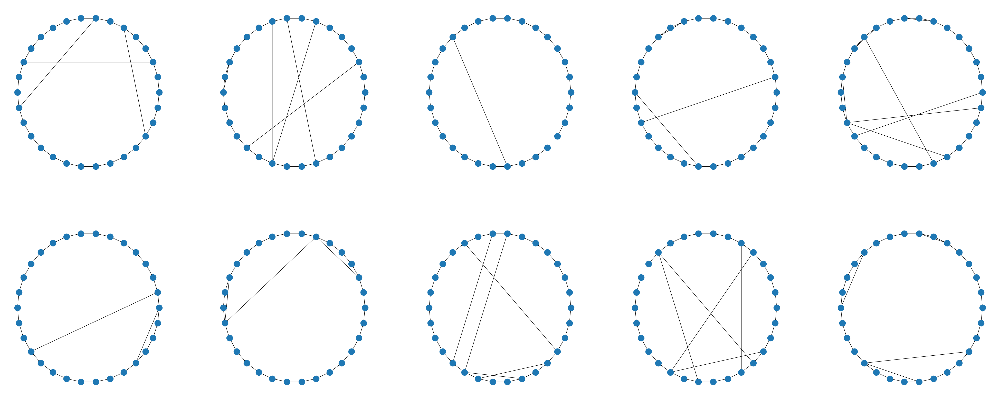

In [44]:
data_type = "ER_noise_circles"
target_size = 30
n_targets = 10

def get_data(target_size, n_targets, data_type, er_p=.01):
    target_sizes= [target_size] * n_targets
    match data_type:
        case "sampled_circles":
            target_graphs = [circle_graph(size, kind="distance") for size in target_sizes]
            original_positions = np.asarray(list(nx.get_node_attributes(target_graphs[0], "pos").values()))
            target_labels = None
        case "ER_noise_circles":
            target_graphs = [add_er_noise(FGW_build_noisy_circular_graph(size, sigma=0), p=er_p) for size in target_sizes]
            target_labels = [get_label_matrix(g) for g in target_graphs]
            original_positions = None
    target_matrices = [weighted_transition_matrix(g, q=0) for g in target_graphs]
    return target_graphs, original_positions, target_labels, target_matrices

target_graphs, original_positions, target_labels, target_matrices = get_data(target_size, n_targets, data_type)
        
_, axes = plt.subplots(n_targets // 5, 5 , figsize=(50, 10 * (n_targets // 5) ))
for G, ax in zip(target_graphs, axes.flat):
    nx.draw(G, pos=nx.get_node_attributes(G, "pos"), ax=ax)


### Tests

In [ ]:
projection_size = 20

projection, parameter_values, losses = opt_loop_batched(
    target_matrices, 
    projection_size=projection_size,
    n_steps=1500,
    heat=1,
    lr=5e-3,
    weight_decay=1e-6,
    run_name=f"{data_type} - barycenter{projection_size} - {(run_number:=vars().get('run_number', 0)+1)}",
    labels=target_labels)

projection.draw(original_positions)

<AxesSubplot:>

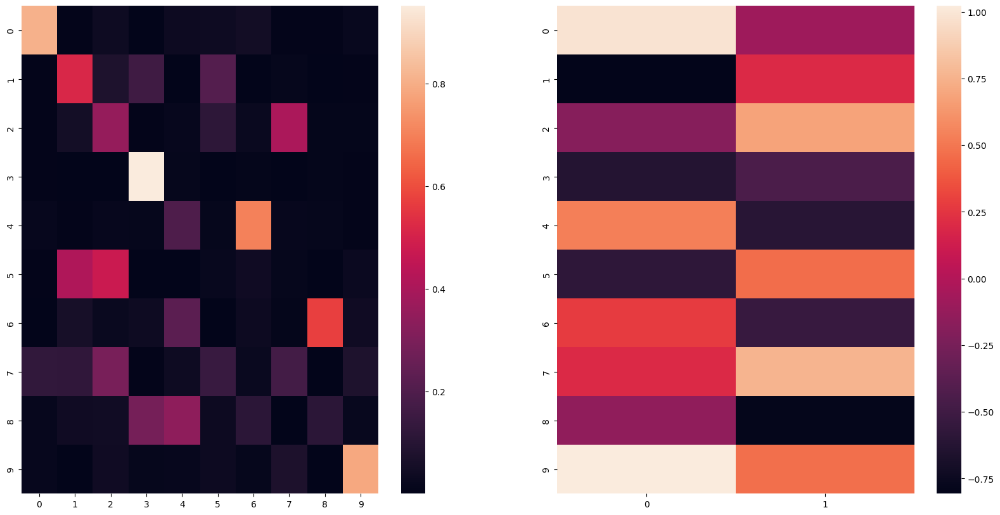

In [108]:
last_markov, last_matching, *_ = parameter_values[-1]
_, axes = plt.subplots(1, 2, figsize=(20, 10))
sns.heatmap(last_markov, ax=axes[0])
sns.heatmap(last_matching, ax=axes[1])

### Barycenter size 10

  0%|          | 0/500 [00:00<?, ?it/s]

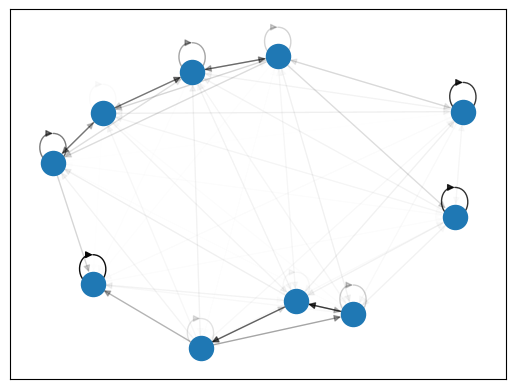

In [107]:
projection, parameter_values, losses = opt_loop_batched(target_matrices, projection_size=10,
    n_steps=500,
    heat=1/10,
    lr=5e-3,
    weight_decay=1e-6,
    run_name=f"data_type - barycenter10 - {(run_number10:=vars().get('run_number10', 0)+1)}",
    labels=target_labels
                                                       ) #funny how I didn’t even write this line with making the ugliest possible code in mind
#Even though it’s got 3 "arcane" features of python in a single expression: f-strings (lawful good), vars() (cahotic neutral), and := (cahotic evil)


projection.draw(original_positions)

<AxesSubplot:>

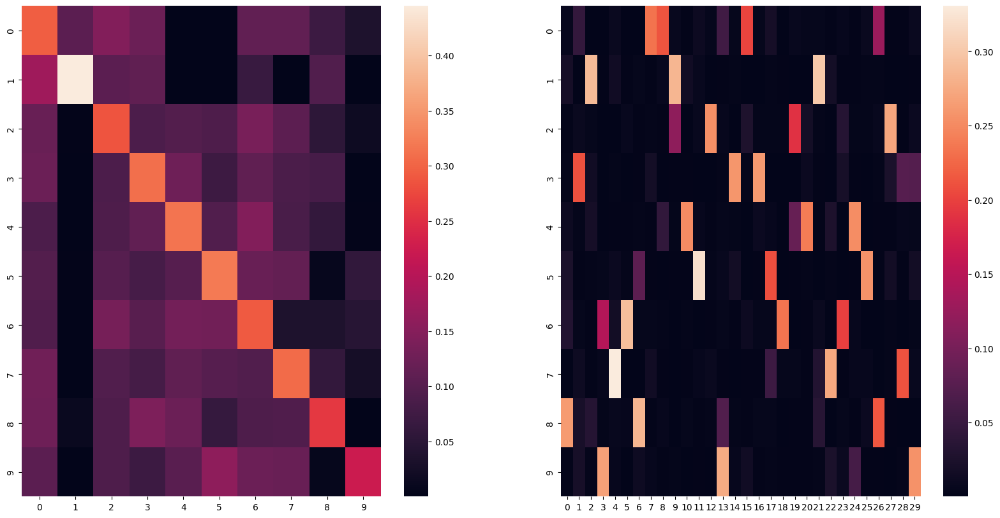

In [91]:
last_markov, last_matching, *_ = parameter_values[-1]
_, axes = plt.subplots(1, 2, figsize=(20, 10))
sns.heatmap(last_markov, ax=axes[0])
sns.heatmap(last_matching, ax=axes[1])

### Grid 1

In [95]:
projection_size = target_size = 20
noise_values = [0, .001, .005, .01, .1]
n_target_parameters = [1, 5, 10, 20, 30, 50]

if "projection_grid" not in vars():
    projection_grid = grid_init(len(noise_values), len(n_target_parameters))


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

/home/tristan/research/ot_markov_distances/ot_markov_distances/discounted_wl.py:210: UserWarning: regularized WL did not converge
  warnings.warn("regularized WL did not converge")


Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


  0%|          | 0/500 [00:00<?, ?it/s]

Stored 'projection_grid' (list)


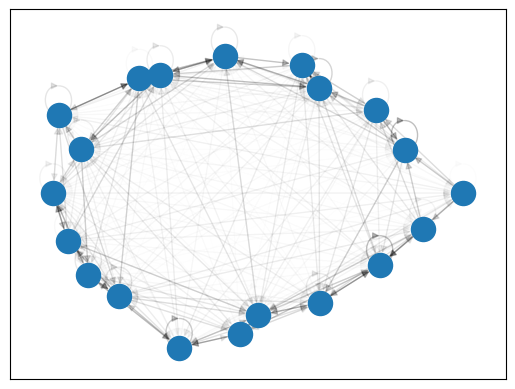

In [226]:
for (noise_index, noise), (n_target_index, n_target) in \
    it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    target_graphs, original_positions, target_labels, target_matrices = get_data(target_size, n_target, data_type,
                                                                   er_p=noise)
    if projection_grid[noise_index][n_target_index] is not None:
        continue
    projection, parameter_values, losses = opt_loop_batched(
        target_matrices, 
        projection_size=projection_size,
        n_steps=500,
        heat=1,
        lr=5e-3,
        weight_decay=0,
        run_name=f"{data_type} - barycenter{projection_size} - {(run_number:=vars().get('run_number', 0)+1)}",
        labels=target_labels
    )
    
    projection_grid[noise_index][n_target_index] = projection.cpu()
    
    %store projection_grid

projection.draw(original_positions)

In [92]:
_, axes = plt.subplots(len(noise_values), len(n_target_parameters), figsize =(len(noise_values)*5, len(n_target_parameters)*5))

for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    if projection_grid[i][j] is None:
        continue
    projection_grid[i][j].draw(ax=axes[i,j])
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


Error in callback <function flush_figures at 0x7f19c815b520> (for post_execute):



KeyboardInterrupt



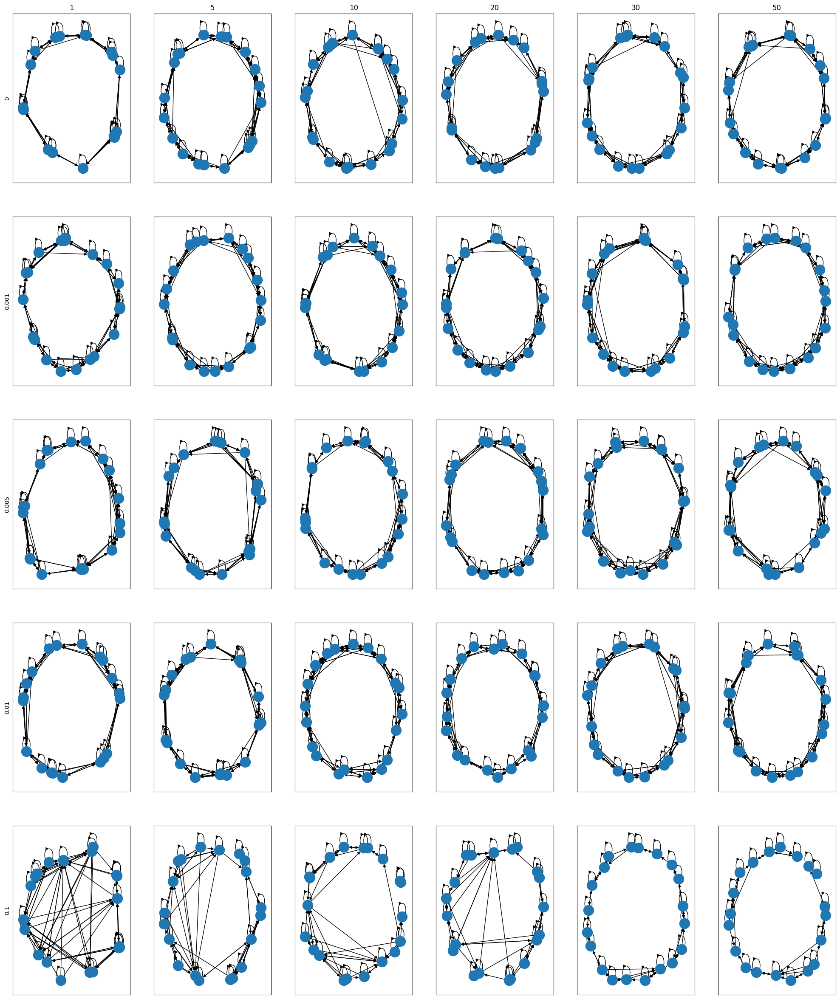

In [256]:
_, axes = plt.subplots(len(noise_values), len(n_target_parameters), figsize =(len(noise_values)*5, len(n_target_parameters)*5))

for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    markov, labels = projection_grid[i][j].get()
    G = markov_threshold(markov.numpy(force=True))
    pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
    nx.draw(G, pos, ax=axes[i, j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


### Grid 2

In [261]:
del projection_grid2
projection_size = target_size = 20
noise_values2 = [.01, .05 ,.1, .2, .3]
n_target_parameters2 = [5, 10, 25, 50]

if "projection_grid2" not in vars():
    projection_grid2 = grid_init(len(noise_values2), len(n_target_parameters2))


  0%|          | 0/5000 [00:00<?, ?it/s]

/home/tristan/research/ot_markov_distances/ot_markov_distances/discounted_wl.py:85: UserWarning: regularized WL did not converge
  warnings.warn("regularized WL did not converge")


  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter serve

  0%|          | 0/5000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter serve

  0%|          | 0/5000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter serve

  0%|          | 0/5000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter serve

  0%|          | 0/5000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

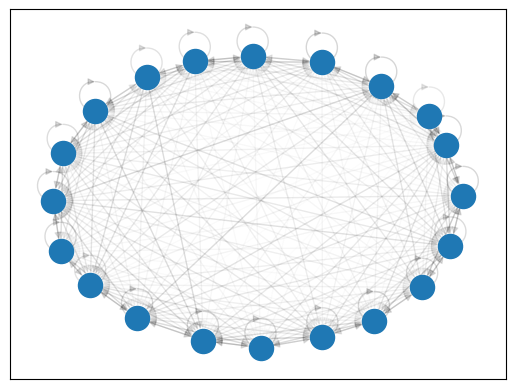

In [262]:
for (noise_index, noise), (n_target_index, n_target) in \
    it.product(enumerate(noise_values2), enumerate(n_target_parameters2)):
    target_graphs, original_positions, target_labels, target_matrices = get_data(target_size, n_target, data_type,
                                                                   er_p=noise)
    if projection_grid2[noise_index][n_target_index] is not None:
        continue
    projection, parameter_values, losses = opt_loop_batched(
        target_matrices, 
        projection_size=projection_size,
        n_steps=5000,
        heat=5,
        lr=5e-3,
        weight_decay=1e-6,
        run_name=f"{data_type} - barycenter{projection_size} - {(run_number:=vars().get('run_number', 0)+1)}",
        labels=target_labels
    )
    
    projection_grid2[noise_index][n_target_index] = projection.cpu()
    
    #%store projection_grid2

projection.draw(original_positions)

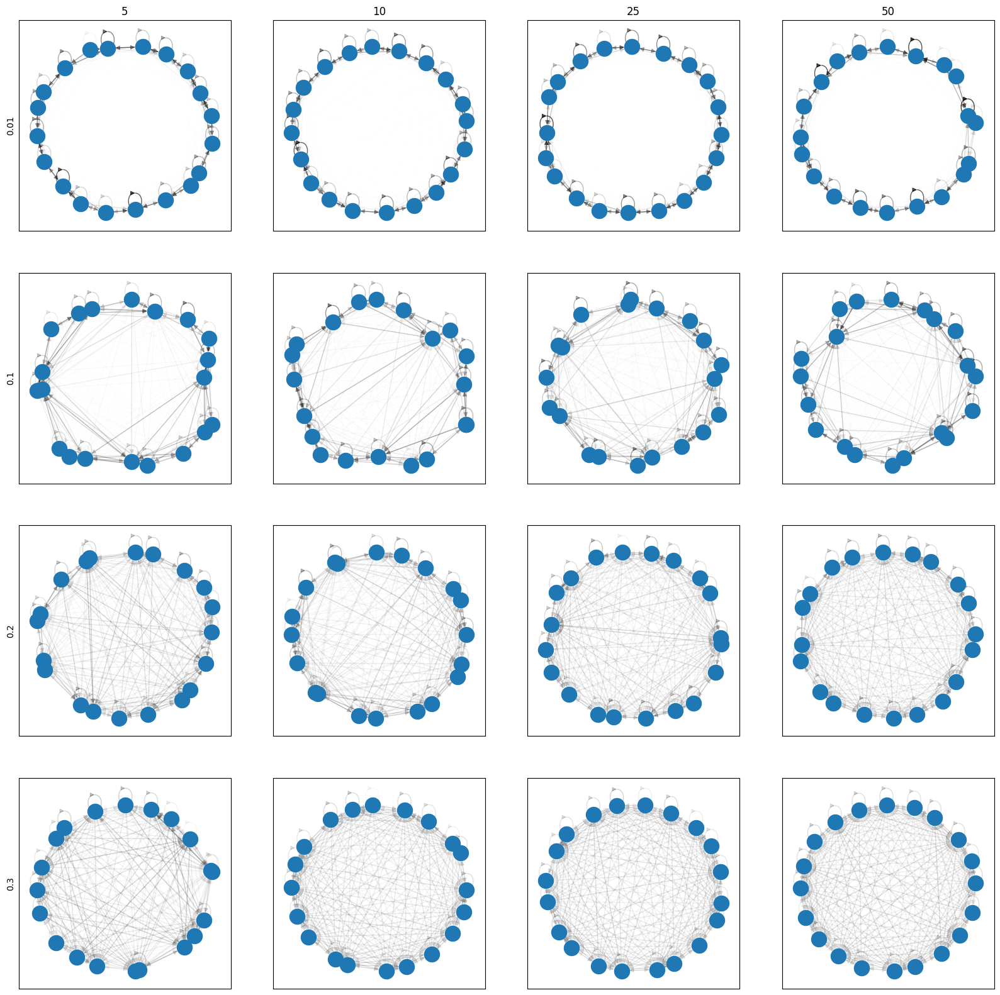

In [239]:
_, axes = plt.subplots(len(noise_values2), len(n_target_parameters2), figsize =(len(noise_values2)*5, len(n_target_parameters2)*5))

for (i, noise), (j, n_targets) in it.product(enumerate(noise_values2), enumerate(n_target_parameters2)):
    projection_grid2[i][j].draw(ax=axes[i,j])
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


Text(0.5, 0.98, 'number of inputs')

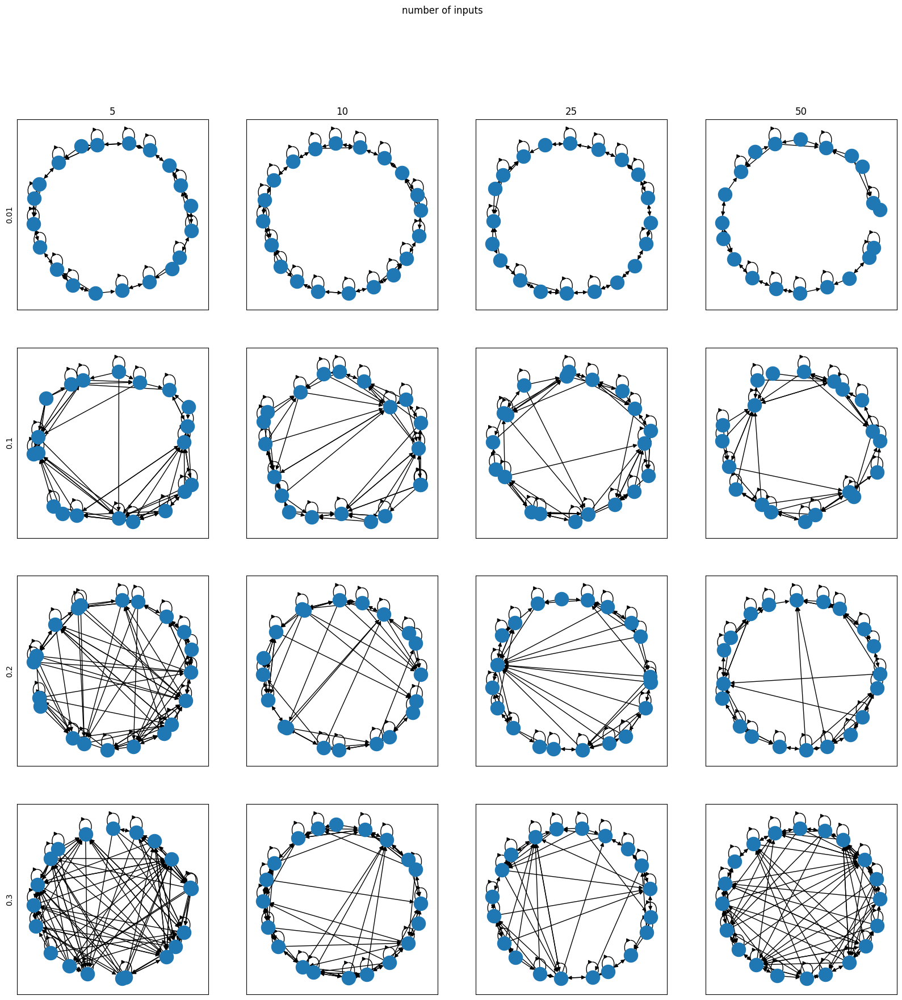

In [258]:
_, axes = plt.subplots(len(noise_values2), len(n_target_parameters2), figsize =(len(noise_values2)*5, len(n_target_parameters2)*5))

for (i, noise), (j, n_targets) in it.product(enumerate(noise_values2), enumerate(n_target_parameters2)):
    markov, labels = projection_grid2[i][j].get()
    G = markov_threshold(markov.numpy(force=True))
    pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
    nx.draw(G, pos, ax=axes[i, j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    
plt.suptitle("number of inputs")



### FGW

In [45]:
sizebary = projection_size = target_size = 20
noise_values = [0, .001, .005, .01, .1]
n_target_parameters = [1, 5, 10, 20, 30, 50]



In [46]:
def rename_attribute(G ,attr1="attr", attr2="attr_name"):
    for node, data in G.nodes(data=True):
        data[attr2] = data[attr1]
        
def to_fgw_graph(G):
    rename_attribute(G)
    return FGW_Graph(G)
to_fgw_graph(target_graphs[0])

In [47]:
from ml_lib.misc import debug_time
from time import perf_counter
logging.basicConfig(level= logging.WARN, force=True)

In [66]:
fgw_projection_grid = grid_init(len(noise_values), len(n_target_parameters))
times = []
for (noise_index, noise), (n_target_index, n_target) in \
    it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    target_graphs, original_positions, target_labels, target_matrices = get_data(target_size, n_target, data_type,
                                                                   er_p=noise)
    FGW_graphs = [to_fgw_graph(i) for i in target_graphs]
    if fgw_projection_grid[noise_index][n_target_index] is not None:
        continue
    X0 = FGW_graphs
    Cs=[x.distance_matrix(force_recompute=True,method='shortest_path') for x in X0]
    ps=[np.ones(len(x.nodes()))/len(x.nodes()) for x in X0]
    Ys=[x.values() for x in X0]
    lambdas=np.array([np.ones(len(Ys))/len(Ys)]).ravel()
    init_X=np.random.rand(projection_size,2)
    t0 = perf_counter()
    D1,C1,log=fgw_barycenters(sizebary,Ys,Cs,ps,lambdas,alpha=0.95,init_X=init_X)
    t1 = perf_counter()
    times.append(t1 - t0)
    bary=nx.from_numpy_array(sp_to_adjency(C1,threshinf=0,threshsup=find_thresh(C1,sup=100,step=100)[0]))
    for i in range(len(D1)):
        bary.add_node(i, pos=D1[i])
    fgw_projection_grid[noise_index][n_target_index] = bary
    
    %store fgw_projection_grid


Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid' (list)
Stored 'fgw_projection_grid'

In [67]:
np.mean(times), np.max(times), np.min(times)

(0.6699159354281922, 4.159470901824534, 0.005218181759119034)

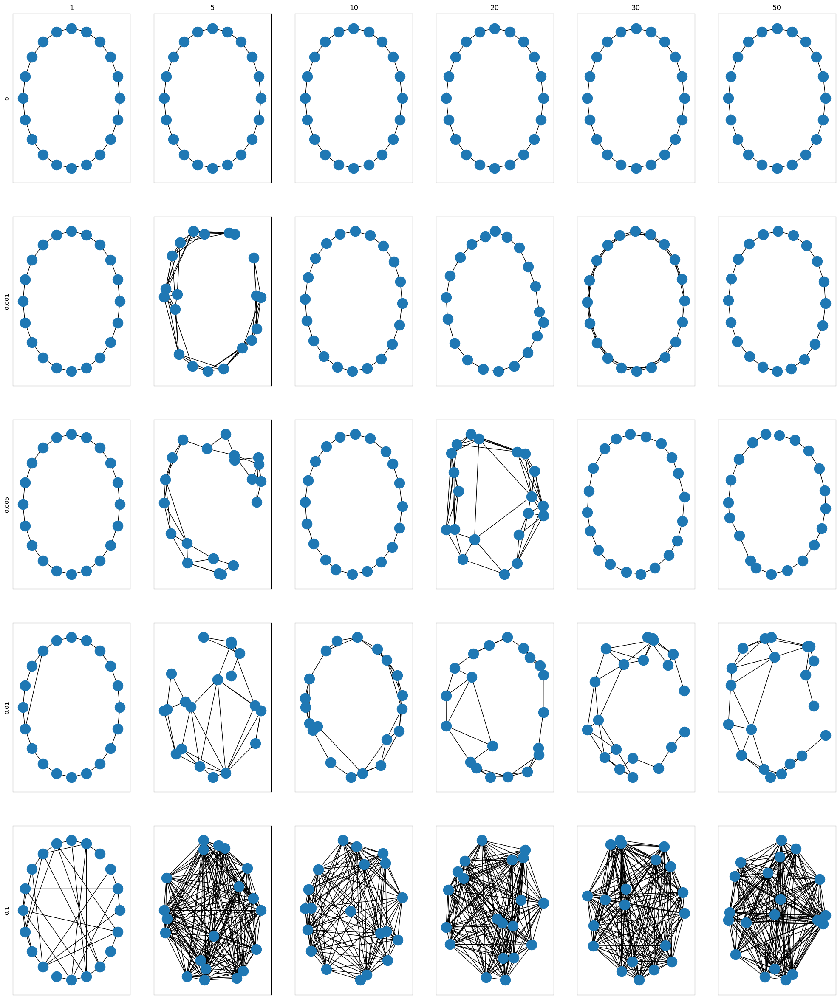

In [67]:
_, axes = plt.subplots(len(noise_values), len(n_target_parameters), figsize =(len(noise_values)*5, len(n_target_parameters)*5))

for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    G = fgw_projection_grid[i][j]
    pos = nx.get_node_attributes(G, "pos")
    nx.draw(G, pos, ax=axes[i, j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


### Single FGW Graph

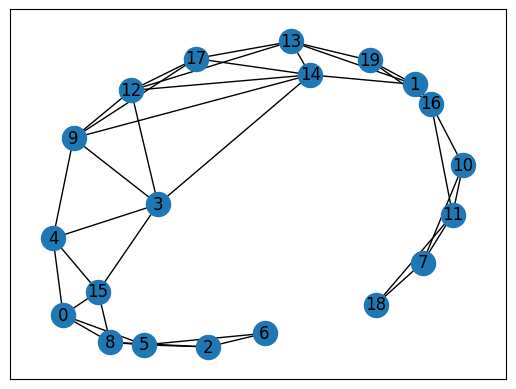

In [56]:
target_size = 20
n_target=20
noise = 0.01

target_graphs, original_positions, target_labels, target_matrices = get_data(target_size, n_target, data_type,
                                                               er_p=noise)
FGW_graphs = [to_fgw_graph(i) for i in target_graphs]
X0 = FGW_graphs
Cs=[x.distance_matrix(force_recompute=True,method='shortest_path') for x in X0]
ps=[np.ones(len(x.nodes()))/len(x.nodes()) for x in X0]
Ys=[x.values() for x in X0]
lambdas=np.array([np.ones(len(Ys))/len(Ys)]).ravel()
init_X=np.random.rand(projection_size,2)
D1,C1,log=fgw_barycenters(sizebary,Ys,Cs,ps,lambdas,alpha=0.95,init_X=init_X)
bary=nx.from_numpy_array(sp_to_adjency(C1,threshinf=0,threshsup=find_thresh(C1,sup=100,step=100)[0]))
for i in range(len(D1)):
    bary.add_node(i, pos=D1[i])
    
pos = nx.get_node_attributes(bary, "pos")
nx.draw_networkx(bary, pos)


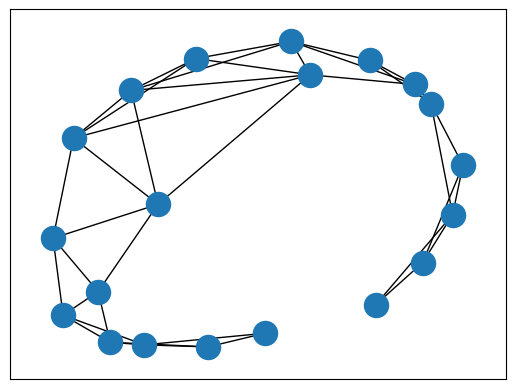

In [57]:
nx.draw_networkx(bary, pos, with_labels=False)


## Directed Graphs

### Data

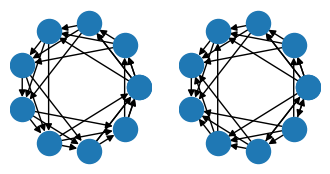

In [12]:
def get_oriented_circle(n, doubled_edges=1):
    G = nx.DiGraph()
    angles = np.linspace(0, 2*np.pi, n)
    x = np.cos(angles)
    y = np.sin(angles)
    coords = np.stack([x, y], axis=-1)
    for node_index, node_coords in zip(range(n), coords):
        G.add_node(node_index, attr=node_coords, pos=node_coords)
        for i in range(1, doubled_edges+1):
            G.add_edge((node_index - i) % n, node_index)
    return G
def get_twopath_circle(n, doubled_edges=1):
    G = nx.DiGraph()
    angles = np.linspace(0, 2*np.pi, n)
    x = np.cos(angles)
    y = np.sin(angles)
    coords = np.stack([x, y], axis=-1)
    for node_index, node_coords in zip(range(n), coords):
        G.add_node(node_index, attr=node_coords, pos=node_coords)
        for edge_i  in range(1, doubled_edges+1):
            if node_index<= n // 2:
                G.add_edge((node_index - edge_i) % n, node_index)
            else: 
                G.add_edge(node_index, (node_index - edge_i) % n)
    return G
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(4, 2))
plt.sca(ax1)
G = get_oriented_circle(10, doubled_edges=3)
nx.draw(G, nx.get_node_attributes(G, "pos"))
plt.sca(ax2)
G = get_twopath_circle(10, doubled_edges=3)
nx.draw(G, nx.get_node_attributes(G, "pos"))


In [13]:

def gen_noisy_oriented_circles(n_targets, target_size, er_p=.05, doubled_edges=2):
    graphs = [get_oriented_circle(target_size, doubled_edges) for _ in range(n_targets)]
    graphs = [add_er_noise(graph, p=er_p) for graph in graphs]
    markovs = torch.stack([weighted_transition_matrix(graph, 0) for graph in graphs])
    distributions = torch.ones(n_targets, target_size) / target_size
    labels = torch.as_tensor(np.asarray(
        [[i for i in nx.get_node_attributes(graph, "attr").values()
            ] for graph in graphs ]
         ), dtype=torch.float32)
    return graphs, markovs, distributions, labels


### oriented circles

In [18]:
bary_size = target_size = 20
n_targets = 50
er_p = .01
#doubled_edges= 2
doubled_edges= 1

graphs, target_markovs, distributions, target_labels = gen_noisy_oriented_circles(n_targets, target_size, er_p, doubled_edges=doubled_edges)
    

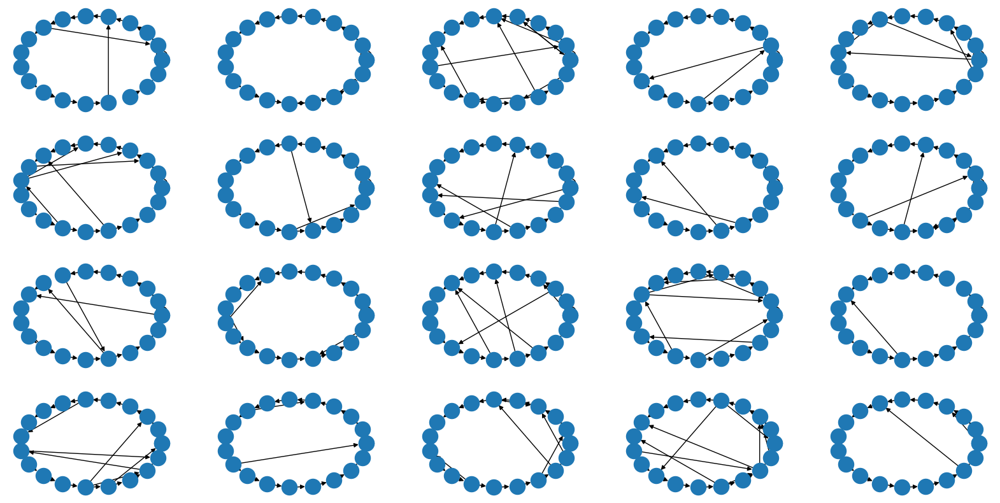

In [19]:
_, axes = plt.subplots(4, 5, figsize=(20, 10))
    
for ax, graph in zip(axes.flat, graphs):
    plt.sca(ax)
    nx.draw(graph, nx.get_node_attributes(graph, "pos"))

In [25]:
device  = torch.device("cuda:0")

In [30]:
bary, parameter_values, losses = opt_loop_batched(
        target_markovs,
        projection_size=target_size,
        device=device,
        n_steps=3000,
        heat=1,
        lr=1e-3,
        weight_decay=0,
        run_name=f"noisy_oriented_circles - barycenter{target_size} - {(run_number:=vars().get('run_number', 0)+1)}",
        labels=target_labels,
        wl_parameters = dict(sinkhorn_reg=.02, delta=.5, x_is_sparse=False, y_is_sparse=True),
    )


  0%|          | 0/3000 [00:00<?, ?it/s]

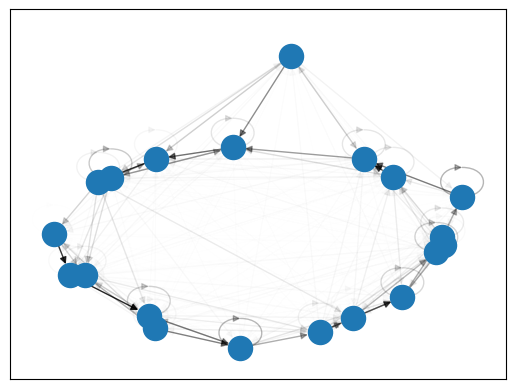

In [29]:
bary.draw()
#plt.gca().tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

And threshold (methods are `my_threshold`, `threshold_yen` and `threshold_otsu`)

In [ ]:
markov, labels = bary.get()
G = markov_threshold(markov.numpy(force=True), method=threshold_otsu)
pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
nx.draw(G, pos)


In [19]:
projection_size = target_size = 20
noise_values = [0, .001, .005, .01, .1]
n_target_parameters = [1, 5, 10, 20, 30, 40]
oriented_grid = grid_init(len(noise_values), len(n_target_parameters))
data_type = "oriented_circle"

In [20]:
#%store -r oriented_grid
for (noise_i, noise), (target_i, n_targets) in tqdm(it.product(enumerate(noise_values), enumerate(n_target_parameters)), total=len(noise_values)*len(n_target_parameters)):
    if oriented_grid[noise_i][target_i] is not None:
        continue
    
    graphs, target_markovs, distributions, target_labels = gen_noisy_oriented_circles(
        n_targets, target_size, noise, doubled_edges=doubled_edges)

    projection, parameter_values, losses = opt_loop_batched(
        target_matrices = target_markovs, 
        projection_size=projection_size,
        n_steps=3000,
        heat=1,
        lr=5e-3,
        weight_decay=0,
        run_name=f"{data_type} - barycenter2 {projection_size}-{noise}",
        labels=target_labels,
        wl_parameters = dict(sinkhorn_reg=.1, delta=.5, x_is_sparse=False, y_is_sparse=True),
        device = torch.device("cuda:2"), 
    )
    oriented_grid[noise_i][target_i] = projection
    #%store oriented_grid
    

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

KeyboardInterrupt: 

doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff
doing stuff


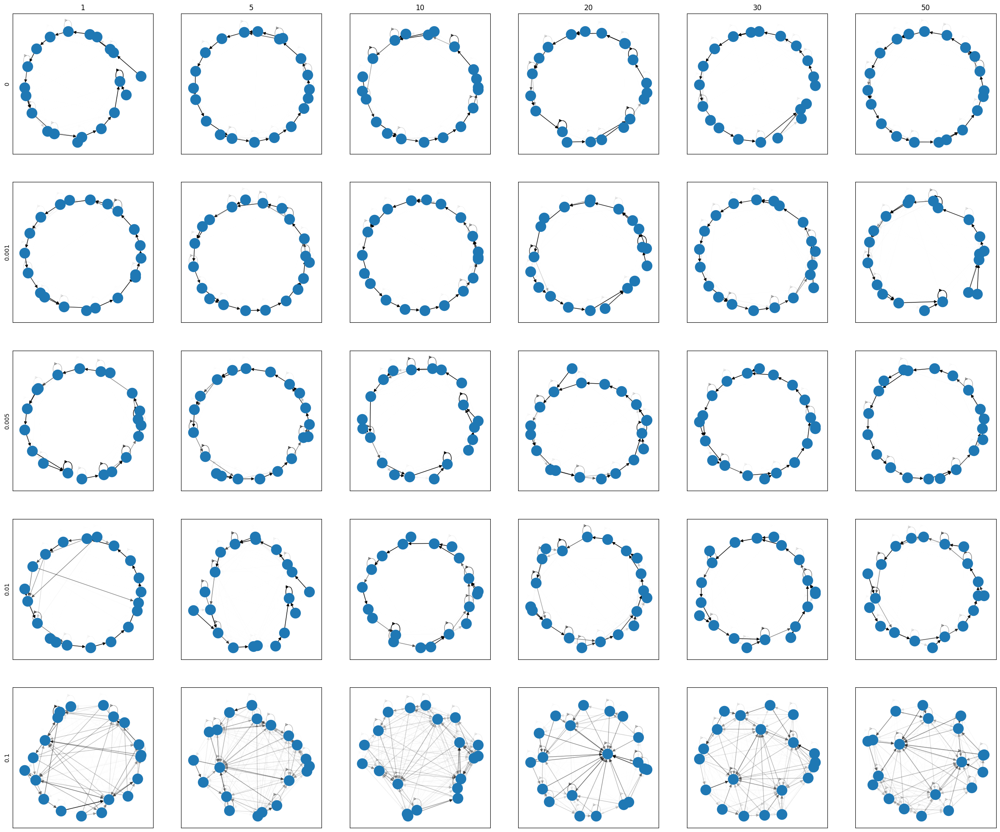

In [114]:
do_threshold=False

n_x = len(noise_values)
n_y = len(n_target_parameters)

_, axes = plt.subplots(n_x, n_y, figsize =(n_y*5, n_x*5))



for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    G = oriented_grid[i][j]
    if do_threshold:    
        markov, labels = G.get()
        G = markov_threshold(markov.numpy(force=True))
        pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
        nx.draw(G, pos, ax=axes[i, j])
    else:     
        G.draw(ax=axes[i,j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


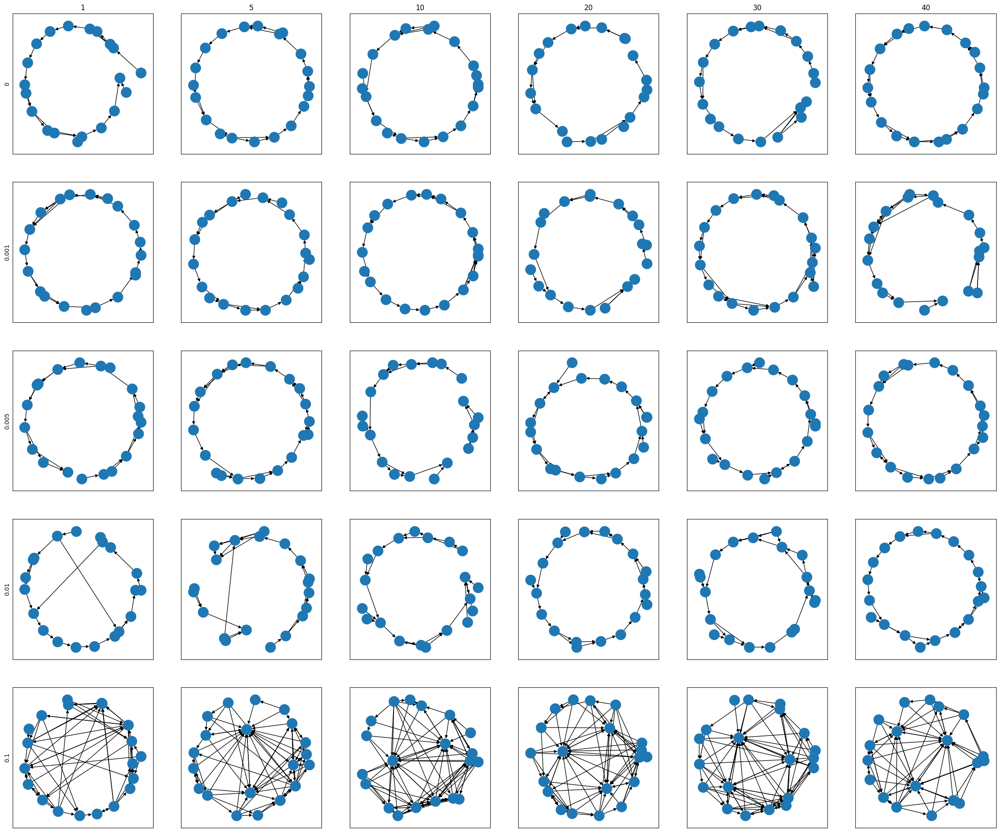

In [135]:
%store -r oriented_grid
do_threshold=True

n_x = len(noise_values)
n_y = len(n_target_parameters)

_, axes = plt.subplots(n_x, n_y, figsize =(n_y*5, n_x*5))



for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    G = oriented_grid[i][j]
    if do_threshold:    
        markov, labels = G.get()
        G = markov_threshold(markov.numpy(force=True), my_threshold)
        G.remove_edges_from(nx.selfloop_edges(G))
        pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
        nx.draw(G, pos, ax=axes[i, j])
    else:     
        G.draw(ax=axes[i,j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


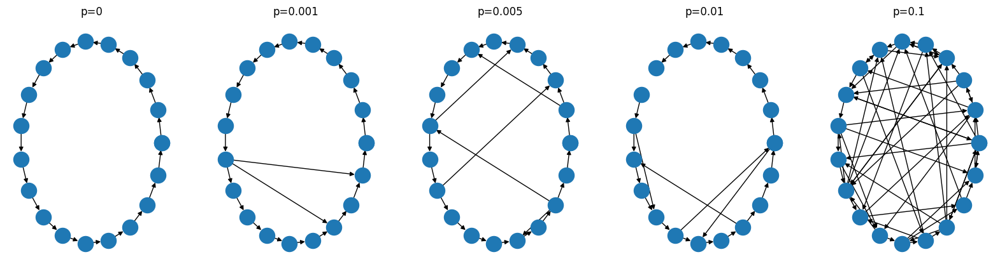

In [141]:
_, axes = plt.subplots(1, len(noise_values), figsize=(20, 5))
    
for ax, noise in zip(axes.flat, noise_values):
    (graph,), _, _, _ = gen_noisy_oriented_circles(1, target_size, er_p=noise, doubled_edges=doubled_edges)
    plt.sca(ax)
    plt.title(f"p={noise}")
    nx.draw(graph, nx.get_node_attributes(graph, "pos"))
    

In [48]:
new_delta_values = [.1, .25, .5, .9, 1.]
new_epsilon_values = [.001, .05, .1, .5, 1, 5]
new_delta_eps_grid = grid_init(len(new_delta_values), len(new_epsilon_values))

for (delta_i, delta_v), (epsilon_i, epsilon_v) in it.product(enumerate(new_delta_values), enumerate(new_epsilon_values)):
    if new_delta_eps_grid[delta_i][epsilon_i] is not None:
        continue
    if delta_v in delta_values: old_delta_i = delta_values.index(delta_v)
    else: continue
    if epsilon_v in epsilon_values: old_epsilon_i = epsilon_values.index(epsilon_v)
    else: continue
    new_delta_eps_grid[delta_i][epsilon_i] = delta_eps_grid[old_delta_i][old_epsilon_i]

np.asarray(new_delta_eps_grid, dtype=object) == None

array([[ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False]])

In [82]:
np.asarray(new_delta_eps_grid, dtype=object) == None

array([[False, False, False, False, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False],
       [ True, False, False,  True, False, False]])

In [83]:
projection_size = target_size = 20
#delta_values = [.1, .25, .5, .9, 1.]
#epsilon_values = [.01, .05, .1, 1, 5]
#delta_eps_grid = grid_init(len(delta_values), len(epsilon_values))
#delta_eps_grid = new_delta_eps_grid
delta_values = new_delta_values
epsilon_values = new_epsilon_values
data_type = "oriented_circle"
n_targets=20
noise=0.01

do_threshold=False

for (delta_i, delta_v), (epsilon_i, epsilon_v) in tqdm(it.product(enumerate(delta_values), enumerate(epsilon_values)), total=len(delta_values)*len(epsilon_values)):
    if delta_eps_grid[delta_i][epsilon_i] is not None:
        continue
    print(delta_i, epsilon_i)
    
    graphs, target_markovs, distributions, target_labels = gen_noisy_oriented_circles(
        n_targets, target_size, noise, doubled_edges=doubled_edges)

    projection, parameter_values, losses = opt_loop_batched(
        target_matrices = target_markovs, 
        projection_size=projection_size,
        n_steps=3000,
        heat=1,
        lr=5e-3,
        weight_decay=0,
        run_name=f"{data_type} - barycenter_delta_eps {delta_v}-{epsilon_v}",
        labels=target_labels,
        wl_parameters = dict(sinkhorn_reg=epsilon_v, delta=delta_v, x_is_sparse=False, y_is_sparse=True),
        device = torch.device("cuda:1"),
    )
    delta_eps_grid[delta_i][epsilon_i] = projection
    %store delta_eps_grid
        


  0%|          | 0/30 [00:00<?, ?it/s]

1 0


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
1 3


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
2 0


  0%|          | 0/3000 [00:00<?, ?it/s]

/home/tristan/research/ot_markov_distances/ot_markov_distances/discounted_wl.py:210: UserWarning: regularized WL did not converge
  warnings.warn("regularized WL did not converge")


Stored 'delta_eps_grid' (list)
2 3


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
3 0


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
3 3


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
4 0


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)
4 3


  0%|          | 0/3000 [00:00<?, ?it/s]

Stored 'delta_eps_grid' (list)


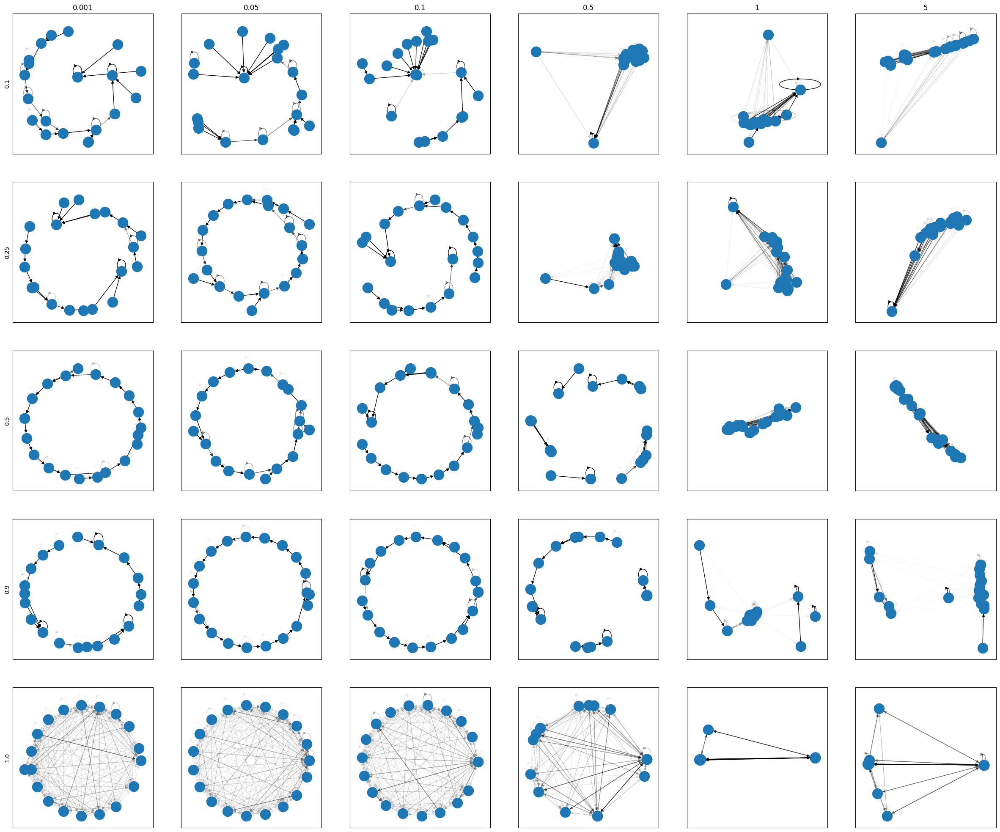

In [85]:
do_threshold=False

n_x = len(delta_values)
n_y = len(epsilon_values)

_, axes = plt.subplots(n_x, n_y, figsize =(n_y*5, n_x*5))



for (i, noise), (j, n_targets) in it.product(enumerate(delta_values), enumerate(epsilon_values)):
    G = delta_eps_grid[i][j]
    if do_threshold:    
        markov, labels = G.get()
        G = markov_threshold(markov.numpy(force=True))
        pos = {i: l.numpy(force=True) for i, l in enumerate(labels)}
        nx.draw(G, pos, ax=axes[i, j])
    else:     
        G.draw(ax=axes[i,j])
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")


### circles with spectral positional encodings

In this part, we assume that we do not have access to meaningful features, and instead use spectral encoding

In [136]:
def gen_noisy_oriented_circles(n_targets, target_size, er_p=.05, doubled_edges=2):
    graphs = [get_oriented_circle(target_size, doubled_edges) for _ in range(n_targets)]
    graphs = [add_er_noise(graph, p=er_p) for graph in graphs]
    markovs = torch.stack([weighted_transition_matrix(graph, 0) for graph in graphs])
    distributions = torch.ones(n_targets, target_size) / target_size
    labels = torch.as_tensor(np.asarray(
        [[i for i in nx.get_node_attributes(graph, "attr").values()
            ] for graph in graphs ]
         ), dtype=torch.float32)
    return graphs, markovs, distributions, labels


def positional_encoding(G, n_eigen=2):
    undi_G = G.to_undirected()
    L = nx.normalized_laplacian_matrix(undi_G)
    _, eigenvectors =  scipy.sparse.linalg.eigsh(L, k=n_eigen + 1, which="LM")
    labels = eigenvectors[:, 1:]
    return torch.as_tensor(labels, dtype=torch.float32)

    

In [125]:
projection_size = target_size = 20

noise_values = [.001, .005, .01, .1]
n_target_parameters = [5, 10, 20, 30, 40]
oriented_grid = grid_init(len(noise_values), len(n_target_parameters))
data_type = "oriented_circle"

for (noise_i, noise), (target_i, n_targets) in tqdm(it.product(enumerate(noise_values), enumerate(n_target_parameters)), total=len(noise_values)*len(n_target_parameters)):
    if oriented_grid[noise_i][target_i] is not None:
        continue
    
    graphs, target_markovs, distributions, target_labels = gen_noisy_oriented_circles(
        n_targets, target_size, noise, doubled_edges=doubled_edges)

    target_labels = torch.stack([positional_encoding(G) for G in graphs])

    projection, parameter_values, losses = opt_loop_batched(
        target_matrices = target_markovs, 
        projection_size=projection_size,
        n_steps=3000,
        heat=1,
        lr=5e-3,
        weight_decay=0,
        run_name=f"{data_type} - barycenter2 {projection_size}-{noise}",
        labels=target_labels,
        wl_parameters = dict(sinkhorn_reg=.1, delta=.8, x_is_sparse=False, y_is_sparse=True),
        device = torch.device("cuda:1"), 
    )
    oriented_grid[noise_i][target_i] = projection
    #%store oriented_grid


    

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

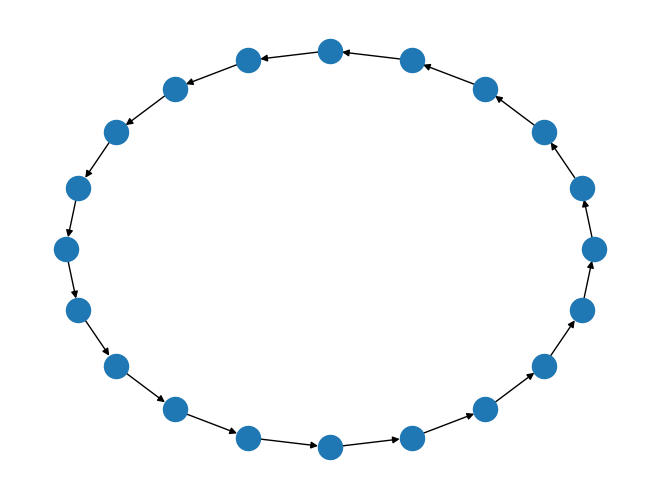

In [206]:
n_targets=30
target_size=20
noise=0.001
graphs, target_markovs, distributions, target_labels = gen_noisy_oriented_circles(
    n_targets, target_size, noise, doubled_edges=doubled_edges)

target_labels = torch.stack([positional_encoding(G, 10) for G in graphs])

#nx.draw(graphs[0], { i: v[:2] for i, v in enumerate(target_labels[0].numpy())})
nx.draw_kamada_kawai(graphs[0])


In [207]:
bary, parameter_values, losses = opt_loop_batched(
        target_markovs,
        projection_size=target_size,
        device=device,
        n_steps=3000,
        heat=1,
        lr=5e-3,
        weight_decay=0,
        run_name=f"barycenter-spectral{target_size} - {(run_number:=vars().get('run_number', 0)+1)}",
        labels=target_labels,
        wl_parameters = dict(sinkhorn_reg=.05, delta=.6, x_is_sparse=False, y_is_sparse=True),
    )


  0%|          | 0/3000 [00:00<?, ?it/s]

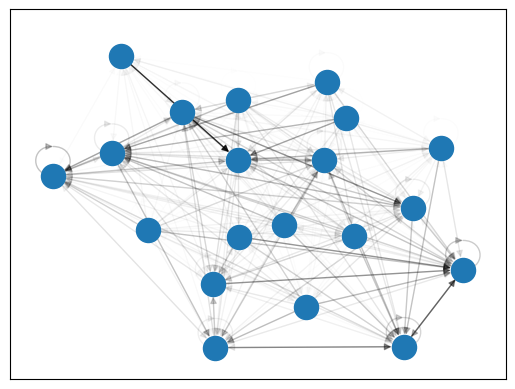

In [209]:
markov, labels = bary.get()
draw_markov(markov)

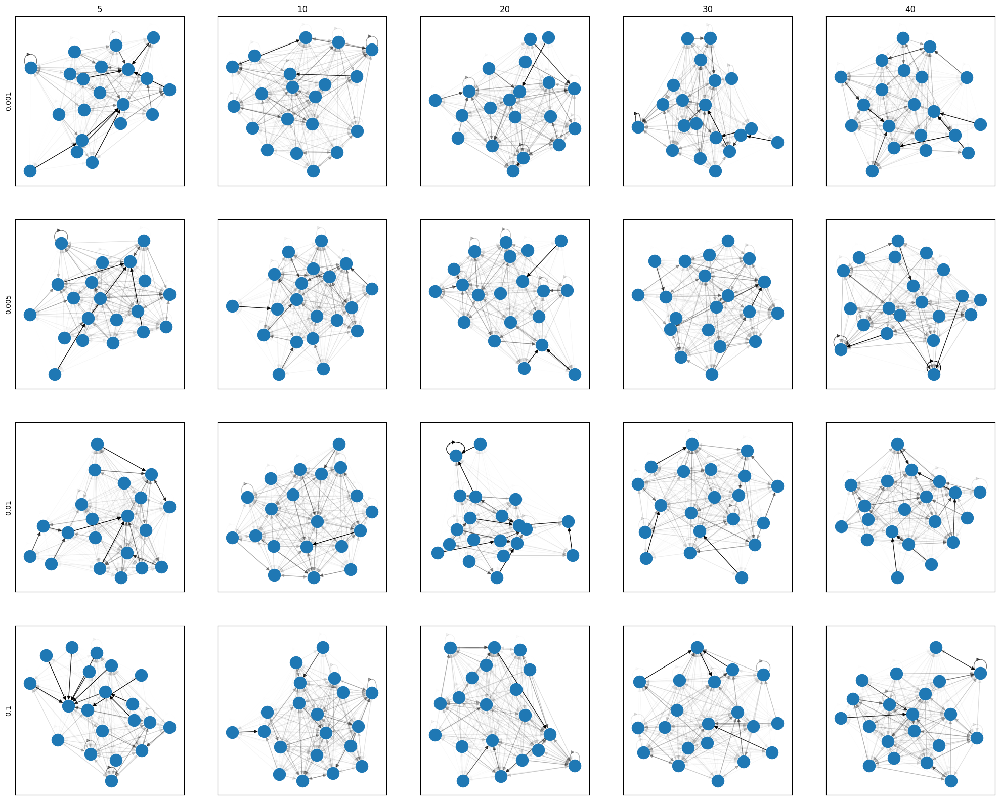

In [133]:
#%store -r oriented_grid
do_threshold=True

n_x = len(noise_values)
n_y = len(n_target_parameters)

_, axes = plt.subplots(n_x, n_y, figsize =(n_y*5, n_x*5))



for (i, noise), (j, n_targets) in it.product(enumerate(noise_values), enumerate(n_target_parameters)):
    G = oriented_grid[i][j]
    markov, labels = G.get()
    plt.sca(axes[i, j])
    draw_markov(markov)
    axes[i, j].set_axis_on()
    if i==0:
        axes[i, j].set_title(f"{n_targets}")
    if j==0:
        axes[i, j].set_ylabel(f"{noise}")
    


### 2-paths circles